In [1]:
import tensorflow as tf
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers
import time

from IPython import display

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: l

/tmp/ipykernel_28/413155558.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  X_train.append(imageio.imread(working_dir + "/" + file))


300


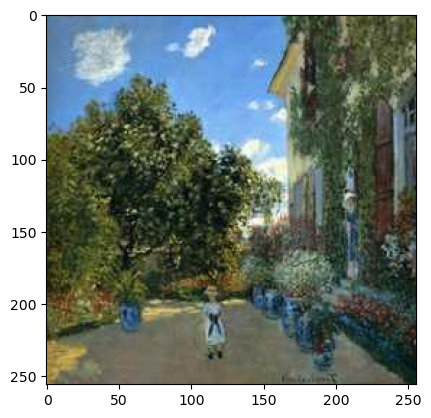

In [134]:
X_train = []

working_dir = '/kaggle/input/gan-getting-started/monet_jpg'

for file in os.listdir(working_dir):
    #print(file)
    X_train.append(imageio.imread(working_dir + "/" + file))

#print(X_train[0:5])
print(len(X_train))

plt.imshow(X_train[3])
plt.show()

In [3]:
#Data augmentation

import copy
from keras.preprocessing.image import ImageDataGenerator

datagens = [
    ImageDataGenerator(zoom_range=[0.2, 1.0]),
    ImageDataGenerator(brightness_range=[0.5,1.5]),
    ImageDataGenerator(rotation_range=90),
    ImageDataGenerator(horizontal_flip=True, vertical_flip=True),
    ImageDataGenerator(height_shift_range=[-20,20], width_shift_range=[-20, 20])
]

X_train_augmented = copy.deepcopy(X_train)
print(len(X_train))

for data in X_train:
    samples = np.expand_dims(data, 0)
    for datagen in datagens:
        it = datagen.flow(samples, batch_size=1)
        # generate samples and plot
        for i in range(5):
            # generate batch of images
            batch = it.next()
            X_train_augmented.append(batch[0].astype('uint8'))

print(len(X_train_augmented))

300
7800


In [4]:
X_train_augmented = np.asarray(X_train_augmented)

np.resize(X_train_augmented.shape[0], (256, 256, 3))

array([[[7800, 7800, 7800],
        [7800, 7800, 7800],
        [7800, 7800, 7800],
        ...,
        [7800, 7800, 7800],
        [7800, 7800, 7800],
        [7800, 7800, 7800]],

       [[7800, 7800, 7800],
        [7800, 7800, 7800],
        [7800, 7800, 7800],
        ...,
        [7800, 7800, 7800],
        [7800, 7800, 7800],
        [7800, 7800, 7800]],

       [[7800, 7800, 7800],
        [7800, 7800, 7800],
        [7800, 7800, 7800],
        ...,
        [7800, 7800, 7800],
        [7800, 7800, 7800],
        [7800, 7800, 7800]],

       ...,

       [[7800, 7800, 7800],
        [7800, 7800, 7800],
        [7800, 7800, 7800],
        ...,
        [7800, 7800, 7800],
        [7800, 7800, 7800],
        [7800, 7800, 7800]],

       [[7800, 7800, 7800],
        [7800, 7800, 7800],
        [7800, 7800, 7800],
        ...,
        [7800, 7800, 7800],
        [7800, 7800, 7800],
        [7800, 7800, 7800]],

       [[7800, 7800, 7800],
        [7800, 7800, 7800],
        [7800, 7

In [5]:
BUFFER = 7800 #used to be 60000
BATCH = 256 #maybe change to 16

training_data = tf.data.Dataset.from_tensor_slices(X_train_augmented).shuffle(BUFFER).batch(BATCH)


In [158]:
def make_generator():
    
    #BASED ON TENSORFLOW TUTORIAL ON DCGAN

    model = tf.keras.Sequential()
    model.add(layers.Dense(32*32*64, use_bias=False, input_shape=(100,)))
    print(model.output_shape)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    print(model.output_shape)
    model.add(layers.Reshape((32, 32, 64)))

    
#     model.add(layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same', use_bias=False))
#     print(model.output_shape)
#     model.add(layers.BatchNormalization())
#     model.add(layers.LeakyReLU())
    
    model.add(layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same', use_bias=False))
    print(model.output_shape)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    
    model.add(layers.Conv2DTranspose(16, (3, 3), strides=(2, 2), padding='same', use_bias=False))
    print(model.output_shape)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (2, 2), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    print(model.output_shape)

    
    return model


(None, 65536)
(None, 65536)
(None, 64, 64, 32)
(None, 128, 128, 16)
(None, 256, 256, 3)


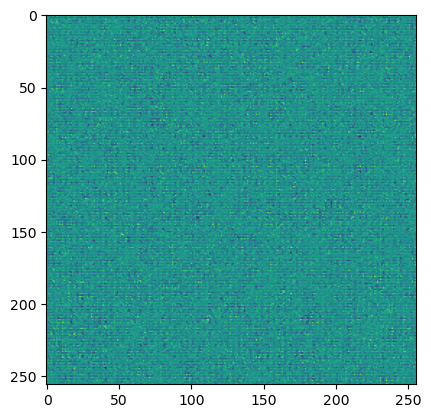

In [159]:
generator = make_generator()

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0])


In [160]:
def make_discriminator():
    model = tf.keras.Sequential()
    
    model.add(layers.Conv2D(16, (3, 3), strides=(2, 2), padding='same',
                                     input_shape=[256, 256, 3]))
    
    #print(model.output_shape)
    model.add(layers.LeakyReLU())
    
    model.add(layers.Conv2D(32, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    #model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    
    model.add(layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    
    #model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())

    model.add(layers.Dense(1))
    #print(model.output_shape)

    return model

In [161]:
discriminator = make_discriminator()
decision = discriminator(generated_image)
print (decision)


tf.Tensor([[0.00049732]], shape=(1, 1), dtype=float32)


In [162]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)


In [163]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [164]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)


In [165]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)


In [166]:
EPOCHS = 250 #OPTIMAL SEEMS TO BE 65
noise_dim = 100
num = 16

seed = tf.random.normal([num, noise_dim])

@tf.function 
def train_step(images):
    noise = tf.random.normal([BATCH, noise_dim])
    
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        
        real = discriminator(images, training=True)
        fake = discriminator(generated_images, training=True)
        
        gen_loss = generator_loss(fake)
        disc_loss = discriminator_loss(real, fake)
        
    gradients_gen = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_disc = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    generator_optimizer.apply_gradients(zip(gradients_gen, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_disc, discriminator.trainable_variables))

In [167]:
def train(dataset, epochs):
    for epoch in range(epochs):
        start = time.time()
        
        for image_batch in dataset:
            train_step(image_batch)
        
        print('Time for epoch {} is {} sec'.format(epoch+1, time.time()-start))
        
        if epoch%5 == 0:
            noise = tf.random.normal([1, 100])
            generated_img = generator(noise, training=False)
            print(generated_img.shape)
            plt.imshow(generated_img[0,:,:,0])
            plt.show()
        
    display.clear_output(wait=True)

Time for epoch 1 is 21.042704820632935 sec
(1, 256, 256, 3)


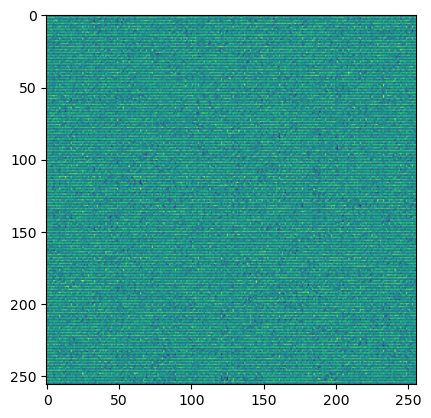

Time for epoch 2 is 13.971168279647827 sec
Time for epoch 3 is 13.478190898895264 sec
Time for epoch 4 is 13.157491683959961 sec
Time for epoch 5 is 20.46249771118164 sec
Time for epoch 6 is 13.01252007484436 sec
(1, 256, 256, 3)


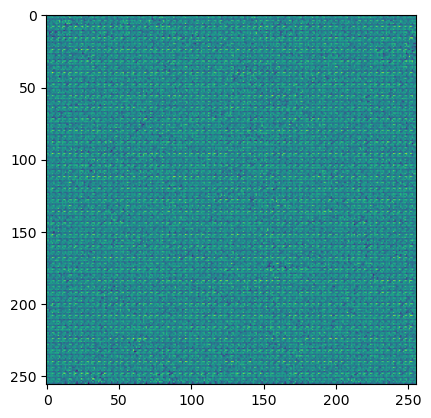

Time for epoch 7 is 13.706575393676758 sec
Time for epoch 8 is 14.019710540771484 sec
Time for epoch 9 is 13.635852813720703 sec
Time for epoch 10 is 13.293140649795532 sec
Time for epoch 11 is 13.168674945831299 sec
(1, 256, 256, 3)


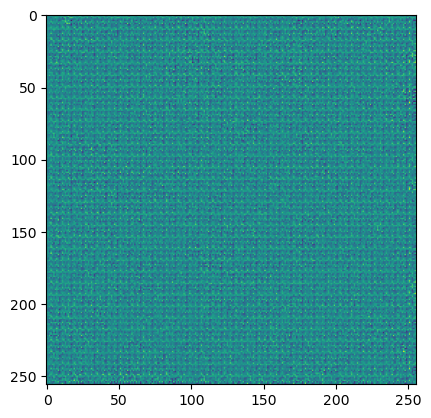

Time for epoch 12 is 13.006306648254395 sec
Time for epoch 13 is 13.529352188110352 sec
Time for epoch 14 is 13.696952819824219 sec
Time for epoch 15 is 13.587891340255737 sec
Time for epoch 16 is 13.477755784988403 sec
(1, 256, 256, 3)


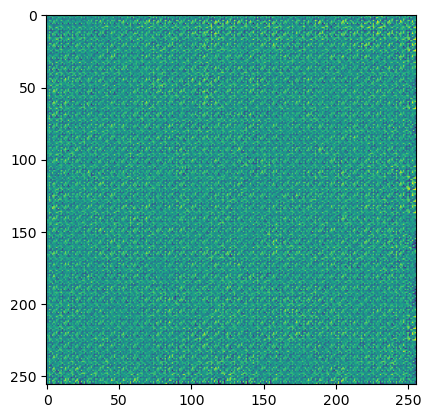

Time for epoch 17 is 13.127869844436646 sec
Time for epoch 18 is 13.437599420547485 sec
Time for epoch 19 is 13.442419052124023 sec
Time for epoch 20 is 13.469507694244385 sec
Time for epoch 21 is 13.51002836227417 sec
(1, 256, 256, 3)


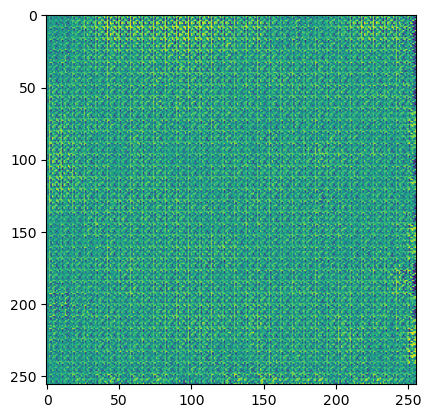

Time for epoch 22 is 13.210344076156616 sec
Time for epoch 23 is 13.60075044631958 sec
Time for epoch 24 is 13.496648788452148 sec
Time for epoch 25 is 13.537383794784546 sec
Time for epoch 26 is 13.524422645568848 sec
(1, 256, 256, 3)


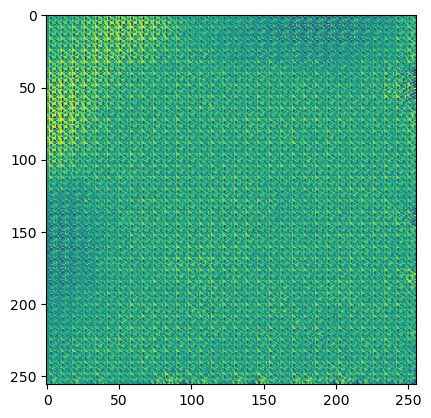

Time for epoch 27 is 13.235041856765747 sec
Time for epoch 28 is 13.556117057800293 sec
Time for epoch 29 is 13.556119203567505 sec
Time for epoch 30 is 13.555226564407349 sec
Time for epoch 31 is 13.549845218658447 sec
(1, 256, 256, 3)


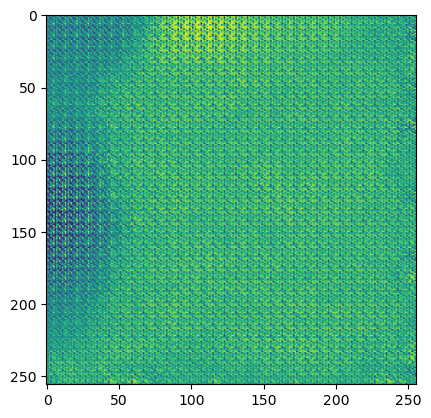

Time for epoch 32 is 13.237101078033447 sec
Time for epoch 33 is 13.568419218063354 sec
Time for epoch 34 is 13.570031642913818 sec
Time for epoch 35 is 13.53069019317627 sec
Time for epoch 36 is 13.462918519973755 sec
(1, 256, 256, 3)


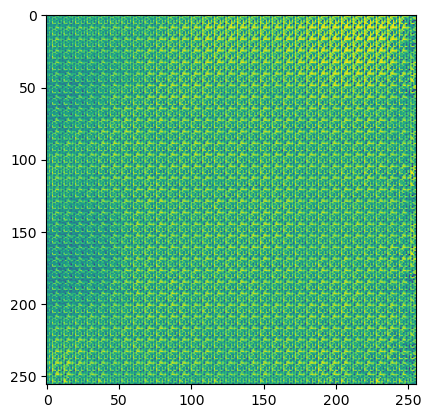

Time for epoch 37 is 13.130131244659424 sec
Time for epoch 38 is 13.43423080444336 sec
Time for epoch 39 is 13.395198345184326 sec
Time for epoch 40 is 13.377115488052368 sec
Time for epoch 41 is 13.387243509292603 sec
(1, 256, 256, 3)


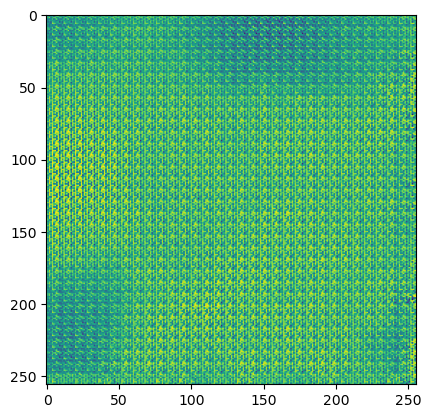

Time for epoch 42 is 13.094070434570312 sec
Time for epoch 43 is 13.3714759349823 sec
Time for epoch 44 is 13.401159763336182 sec
Time for epoch 45 is 13.360929250717163 sec
Time for epoch 46 is 13.432105541229248 sec
(1, 256, 256, 3)


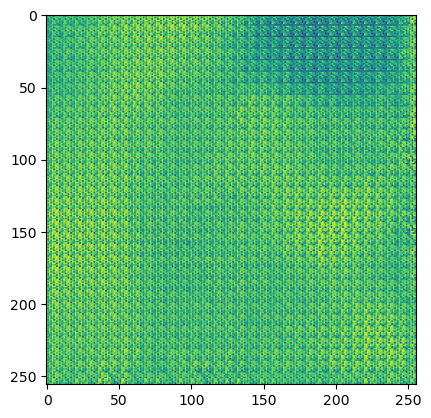

Time for epoch 47 is 13.149619340896606 sec
Time for epoch 48 is 13.517434120178223 sec
Time for epoch 49 is 13.588963985443115 sec
Time for epoch 50 is 13.568746328353882 sec
Time for epoch 51 is 13.53744626045227 sec
(1, 256, 256, 3)


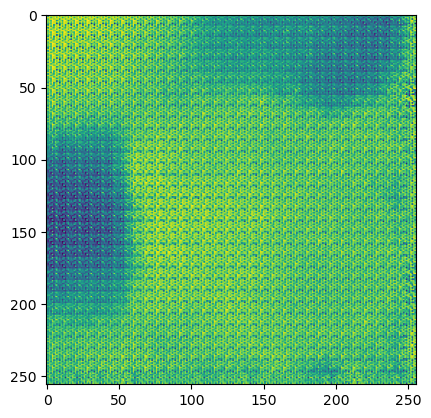

Time for epoch 52 is 13.183138608932495 sec
Time for epoch 53 is 13.45523452758789 sec
Time for epoch 54 is 13.4574294090271 sec
Time for epoch 55 is 13.433574676513672 sec
Time for epoch 56 is 13.440452337265015 sec
(1, 256, 256, 3)


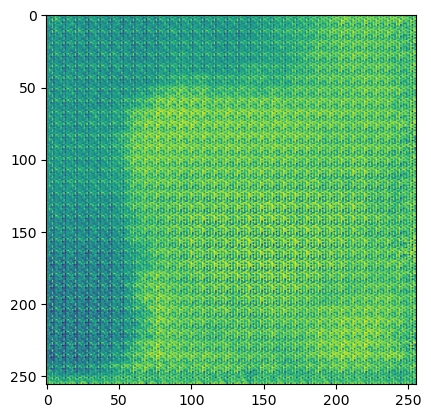

Time for epoch 57 is 13.095232009887695 sec
Time for epoch 58 is 13.415575981140137 sec
Time for epoch 59 is 13.394110679626465 sec
Time for epoch 60 is 13.417158365249634 sec
Time for epoch 61 is 13.43100881576538 sec
(1, 256, 256, 3)


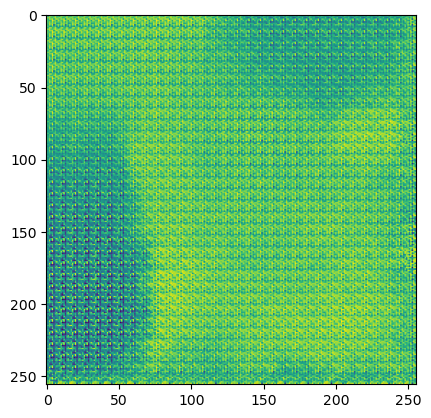

Time for epoch 62 is 13.13402271270752 sec
Time for epoch 63 is 13.474893569946289 sec
Time for epoch 64 is 13.48726224899292 sec
Time for epoch 65 is 13.488327026367188 sec
Time for epoch 66 is 13.510127067565918 sec
(1, 256, 256, 3)


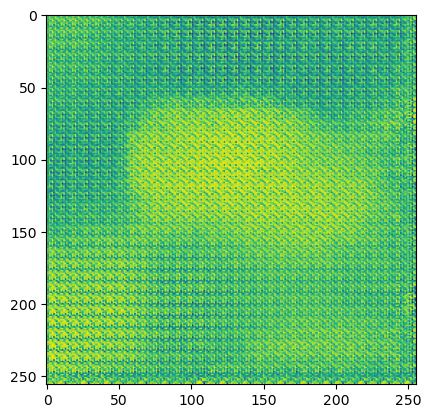

Time for epoch 67 is 13.19165563583374 sec
Time for epoch 68 is 13.512932062149048 sec
Time for epoch 69 is 13.481944561004639 sec
Time for epoch 70 is 13.53257131576538 sec
Time for epoch 71 is 13.52634882926941 sec
(1, 256, 256, 3)


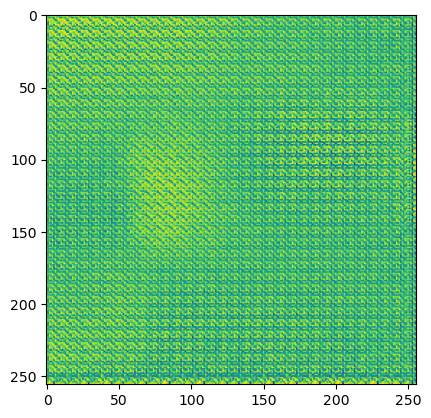

Time for epoch 72 is 13.22257113456726 sec
Time for epoch 73 is 13.5433189868927 sec
Time for epoch 74 is 13.562386274337769 sec
Time for epoch 75 is 13.628247261047363 sec
Time for epoch 76 is 13.490118503570557 sec
(1, 256, 256, 3)


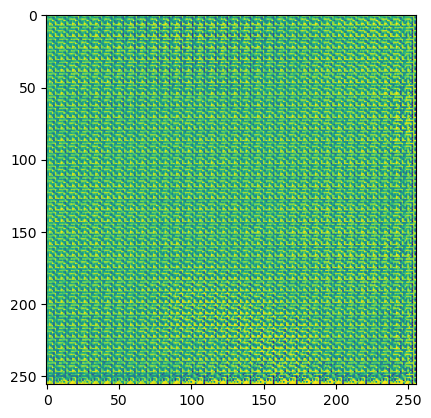

Time for epoch 77 is 13.227466821670532 sec
Time for epoch 78 is 13.541083097457886 sec
Time for epoch 79 is 13.548442602157593 sec
Time for epoch 80 is 13.563818216323853 sec
Time for epoch 81 is 13.541985511779785 sec
(1, 256, 256, 3)


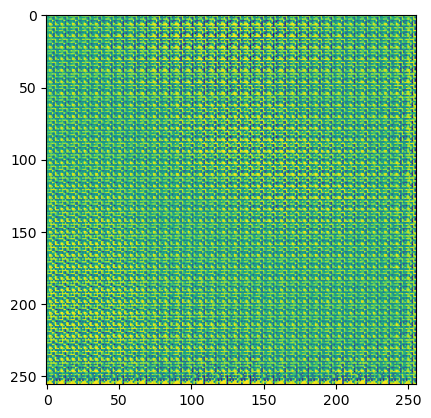

Time for epoch 82 is 13.202044010162354 sec
Time for epoch 83 is 13.505802869796753 sec
Time for epoch 84 is 13.548350095748901 sec
Time for epoch 85 is 13.521992444992065 sec
Time for epoch 86 is 13.522515296936035 sec
(1, 256, 256, 3)


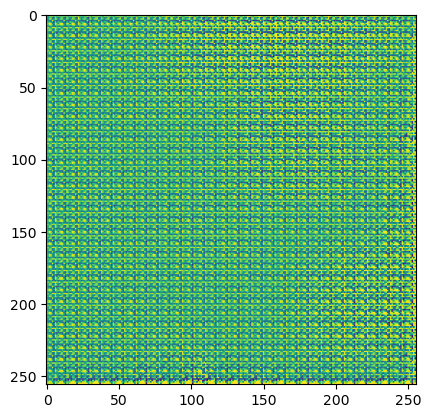

Time for epoch 87 is 13.2383873462677 sec
Time for epoch 88 is 13.51842451095581 sec
Time for epoch 89 is 13.514071702957153 sec
Time for epoch 90 is 13.516644477844238 sec
Time for epoch 91 is 13.53910231590271 sec
(1, 256, 256, 3)


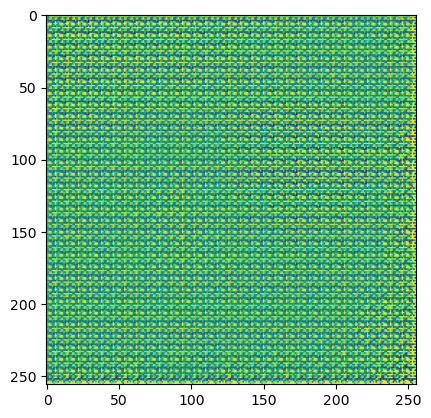

Time for epoch 92 is 13.182952404022217 sec
Time for epoch 93 is 13.581904649734497 sec
Time for epoch 94 is 13.45350980758667 sec
Time for epoch 95 is 13.523809909820557 sec
Time for epoch 96 is 13.529205560684204 sec
(1, 256, 256, 3)


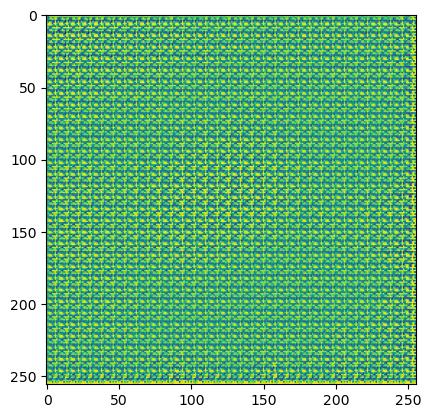

Time for epoch 97 is 13.202487707138062 sec
Time for epoch 98 is 13.513646364212036 sec
Time for epoch 99 is 13.52996301651001 sec
Time for epoch 100 is 13.525948524475098 sec
Time for epoch 101 is 13.531352281570435 sec
(1, 256, 256, 3)


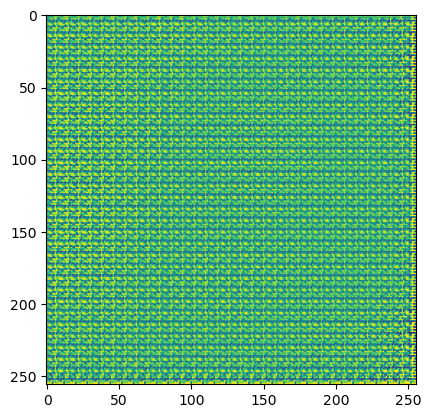

KeyboardInterrupt: 

In [168]:

train(training_data, EPOCHS)

(1, 256, 256, 3)


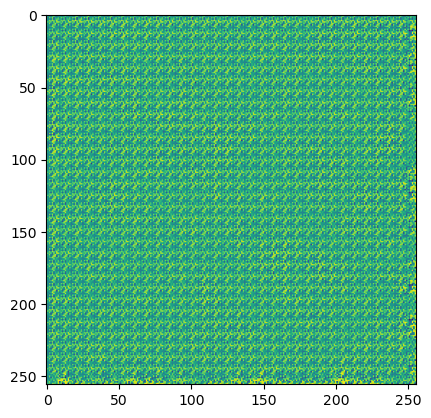

In [156]:
noise = tf.random.normal([1, 100])
generated_img = generator(noise, training=False)
print(generated_img.shape)
plt.imshow(generated_img[0,:,:,0])


#https://github.com/thuylinh225/Generate_Monet_Images_Using_DCGAN/blob/main/generate-monet-images-using-dcgan.ipynb